# Robust methods for intervention selections using Thompson Sampling
This notebooks explores robust methods for using thompson sampling in Self-E

In [1]:
# Imports & preperation code
%load_ext autoreload
%autoreload 2

import numpy
from adaptive_nof1.models import Model, SelfExperimentationModel
from adaptive_nof1.basic_types import Outcome, History

from adaptive_nof1 import SeriesOfSimulationsRunner, SeriesOfSimulationsData
from adaptive_nof1.policies import (
    FixedPolicy,
    ThompsonSampling,
    BalancedThompsonSampling,
    ClippedThompsonSampling,
    ComposedPolicy,
)
from adaptive_nof1.inference import (
    FastNormalApproximation,
    BetaModel,
    ConjugateNormalModel,
    SlidingModel,
)
from adaptive_nof1.helpers import *
from adaptive_nof1.series_of_simulations_runner import simulate_configurations
from adaptive_nof1.metrics import SimpleRegret, RegretAgainstOtherConfiguration
from sklearn.linear_model import Ridge
import matplotlib.pyplot as plt
import holoviews
import pandas

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [2]:
## Helper functions to do the analyses
def switch_config(config):
    config = config.copy()
    config["policy"] = "FixedPolicy"
    return config


def plot_regret_against_fixed(calculated_series, config_to_simulation_data):
    models = numpy.unique([s["configuration"]["model"] for s in calculated_series])
    for model in models:
        plt.figure()
        plt.title(model)
        SeriesOfSimulationsData.plot_lines(
            [
                series["result"]
                for series in calculated_series
                if series["configuration"]["model"] == model
            ],
            [
                RegretAgainstOtherConfiguration(
                    configuration_transform_function=switch_config,
                    config_to_simulation_data=config_to_simulation_data,
                    outcome_name="outcome",
                )
            ],
            legend_position=(0, 1.5),
        )

## Methodology

We start with a simple simulation model, and then add different features with make learning harder, namely:
- changes in baseline
- correlation in the outcomes
- spikes in the data.
After analysing how the algorithms behave, we will test different additions to it.
## Simulation Model
We assume ordinal outcomes between 0 and 5 for our simulation model.
It is assumed that this ordinal measure is achieved by mapping a continuous outcome onto 5 point scale. The decision boundaries are chosen by dividing the probability mass of a $N(0,1)$ distribution into equal parts. They are -0.84, -0.25, 0.25 and 0.84.
In the most basic case, the outcome is defined as: $outcome(a) = baseline + \text{effect}(a)$.

## Policies
We start with three policies for comparison:
- Fixed, Balanced Design
- Thompson Sampling with Beta Model
- Thompson Sampling with Conjugate Normal Model

## Bayesian Models
### BetaModel
This is currently used in the Self-E app.
Let $c$ be the number of the condition.
This model estimates the probability $p$ of an intervention beeing sucessfull as $p \sim Beta(a_c + 1, b_c + 1)$, where $a = count(outcome(c) \geq average(outcome))$ "number of sucesses", and $b = count(outcome(c) < average(outcome)$ "number of failures".
Then, it uses sampling to estimate the probability $Beta(a_1,b_1) > Beta(a_2, b_2)$
Since $a_c$ and $b_c$ are 0 if there is no data $Beta(1, 1)$ it the prior distribution.

### ConjugateNormalModel
This model models each outcome as a Normal random variable $N(\mu_c,\sigma_c)$.  
It uses the normal inverse gamma function $ING(mean, l, alpha, beta)$ as prior, because this is the conjugate prior to the normal distribution and therefore makes updating very easy.
The used priors are shown below, and are set to be weakly informative. The prior predictive simulation shows how the predicted values range from 0 to 5.


## Evaluation
We evaluate different metrics that could be interesting:  
Regret is defined as the difference in the sum of outcomes between to policies. For our case, we want to compare against the fixed schedule.
We define the regret as  
$Regret(policy) = \sum_{t}^T Reward(t)_{fixed} - \sum_{t}^T Reward(t)_{adaptive}$.

We evaluate:
- Mean Regret
- Median Regret
- 0.25 and 0.75 quantiles of regret
- Span between best and worst regret (per participant)
- Best Intervention Identification: Percentage of Participants getting the correct prediction at timepoint t
  - For fixed, this will be determined by difference in means between both conditions
  - For the Bayesian Models, the preferred condition will be determined by the maximum probability of selection at the last timepoint


Text(0.5, 1.0, 'Prior predictive distribution for ConjugateNormalModel')

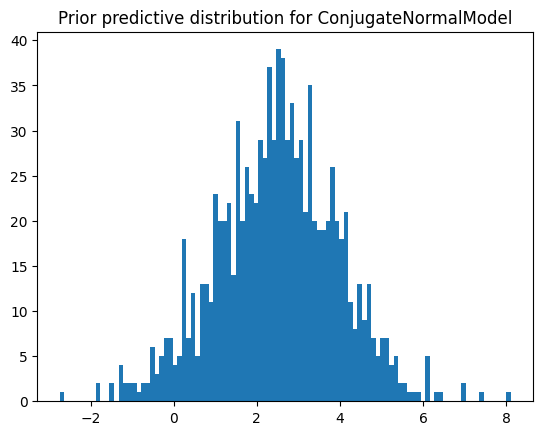

In [3]:
# Code for setting priors
conjugate_normal_model_priors = {
    "mean": 2.5,
    "l": 0.5,
    "alpha": 10,
    "beta": 10,
}
## Print posterior distribution of priors
model = ConjugateNormalModel(**conjugate_normal_model_priors)
plt.hist(
    model.sample_normal_inverse_gamma(
        model.mean, model.l, model.alpha, model.beta, 10000, 1
    ),
    bins=100,
)
plt.title("Prior predictive distribution for ConjugateNormalModel")

In [4]:
# Code for calculating evaluation
def calculate_recommendations(calculated_series):
    data = []
    for result in calculated_series:
        series_of_simulations_data = result["result"]
        for simulation in series_of_simulations_data.simulations:
            observation = simulation.history.observations[-1]
            if "probabilities" in observation.debug_data:
                # print(observation.debug_data["probabilities"])
                probabilities = observation.debug_data["probabilities"]
                data.append(
                    {
                        **simulation.configuration,
                        "p_assigned_intervention_1": probabilities[1],
                        "p_assigned_intervention_0": probabilities[0],
                        "recommendation": numpy.argmax(probabilities),
                    }
                )
                # print(data)
            else:
                df = simulation.history.to_df()
                data.append(
                    {
                        **simulation.configuration,
                        "recommendation": numpy.argmax(
                            df.groupby("treatment")["outcome"].mean()
                        ),
                    }
                )
    recommended_interventions_df = pandas.DataFrame(data)
    return recommended_interventions_df


def generate_result_table(calculated_series):
    # Things for the table: mean regret, median regret, 25% regret, 75% regret, bias when fitting linear regression model
    metrics = [
        RegretAgainstOtherConfiguration(
            configuration_transform_function=switch_config,
            config_to_simulation_data=config_to_simulation_data,
            outcome_name="outcome",
        ),
    ]
    series = [entry["result"] for entry in calculated_series]
    scores = SeriesOfSimulationsData.score_data(
        series,
        metrics,
    )
    scores = scores[scores["t"] == scores["t"].max()]
    table = pandas.DataFrame()
    table["mean_regret"] = scores.groupby(["policy", "model"])["score"].mean()
    table["median_regret"] = scores.groupby(["policy", "model"])["score"].median()
    table[".25 quantile regret"] = scores.groupby(["policy", "model"])[
        "score"
    ].quantile(0.25)
    table[".75 quantile regret"] = scores.groupby(["policy", "model"])[
        "score"
    ].quantile(0.75)
    table[".95 quantile regret"] = scores.groupby(["policy", "model"])[
        "score"
    ].quantile(0.95)
    table[".05 quantile regret"] = scores.groupby(["policy", "model"])[
        "score"
    ].quantile(0.05)
    table["Span of regret"] = (
        scores.groupby(["policy", "model"])["score"].max()
        - scores.groupby(["policy", "model"])["score"].min()
    )
    recommended_interventions_df = calculate_recommendations(calculated_series)
    table["p_assigned_intervention_1_mean"] = recommended_interventions_df.groupby(
        ["policy", "model"]
    )["p_assigned_intervention_1"].mean()
    table["recommendation_mean"] = recommended_interventions_df.groupby(
        ["policy", "model"]
    )["recommendation"].mean()
    return table.swaplevel("policy", "model").sort_index()

In [5]:
# Prepare simulation constants
N_INTERVENTIONS = 2
LENGTH = 40
N_PATIENTS = 100

## Scenario 1:
Let's start with a simple scenario: $baseline \sim Normal(0, 1)$, Treatment effects differ.
We look at 3 different effects:
- Scenario 1.1: -1 // Treatment worsens outcome
- Scenario 1.2: 0  // Treatment does not change outcome
- Scenario 1.3: 1  // Treatment improves outcome

In [6]:
# Define models
data_generating_model_1_1 = lambda patient_id: SelfExperimentationModel(
    patient_id,
    intervention_effects=[0, -1],
    baseline_model="noise",
    baseline_config={"variance": 1},
)
data_generating_model_1_2 = lambda patient_id: SelfExperimentationModel(
    patient_id,
    intervention_effects=[0, 0],
    baseline_model="noise",
    baseline_config={"variance": 1},
)
data_generating_model_1_3 = lambda patient_id: SelfExperimentationModel(
    patient_id,
    intervention_effects=[0, 1],
    baseline_model="noise",
    baseline_config={"variance": 1},
)

In [7]:
# Define policies
fixed_policy = FixedPolicy(number_of_actions=N_INTERVENTIONS)
linear_ts = ThompsonSampling(
    inference_model=ConjugateNormalModel(**conjugate_normal_model_priors),
    number_of_actions=N_INTERVENTIONS,
)
beta_ts = ThompsonSampling(
    inference_model=BetaModel(),
    number_of_actions=N_INTERVENTIONS,
)

In [8]:
# Full crossover study
study_designs = {
    "n_patients": [N_PATIENTS],
    "policy": [fixed_policy, linear_ts, beta_ts],
    "model_from_patient_id": [
        data_generating_model_1_1,
        data_generating_model_1_2,
        data_generating_model_1_3,
    ],
}
configurations = generate_configuration_cross_product(study_designs)

In [9]:
calculated_series, config_to_simulation_data = simulate_configurations(
    configurations, LENGTH
)

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

In [10]:
generate_result_table(calculated_series)

mean_regret  \
model                     policy                                                
SEM[[0, -1], noise, 0, 0] FixedPolicy                                    0.00   
                          ThompsonSampling(BetaModel)                  -15.75   
                          ThompsonSampling(ConjugateNormalModel)       -17.76   
SEM[[0, 0], noise, 0, 0]  FixedPolicy                                    0.00   
                          ThompsonSampling(BetaModel)                    0.00   
                          ThompsonSampling(ConjugateNormalModel)         0.00   
SEM[[0, 1], noise, 0, 0]  FixedPolicy                                    0.00   
                          ThompsonSampling(BetaModel)                  -16.14   
                          ThompsonSampling(ConjugateNormalModel)       -17.88   

                                                                  median_regret  \
model                     policy                                                  
SEM[[0, -1], noise, 0, 0] FixedPolicy                                       0.0   
                          ThompsonSampling(BetaModel)                     -16.0   
                          ThompsonSampling(ConjugateNormalModel)          -19.0   
SEM[[0, 0], noise, 0, 0]  FixedPolicy                                       0.0   
                          ThompsonSampling(BetaModel)                       0.0   
                          ThompsonSampling(ConjugateNormalModel)            0.0   
SEM[[0, 1], noise, 0, 0]  FixedPolicy                                       0.0   
                          ThompsonSampling(BetaModel)                     -16.0   
                          ThompsonSampling(ConjugateNormalModel)          -19.0   

                                                                  .25 quantile regret  \
model                     policy                                                        
SEM[[0, -1], noise, 0, 0] FixedPolicy                                             0.0   
                          ThompsonSampling(BetaModel)                           -20.0   
                          ThompsonSampling(ConjugateNormalModel)                -22.0   
SEM[[0, 0], noise, 0, 0]  FixedPolicy                                             0.0   
                          ThompsonSampling(BetaModel)                             0.0   
                          ThompsonSampling(ConjugateNormalModel)                  0.0   
SEM[[0, 1], noise, 0, 0]  FixedPolicy                                             0.0   
                          ThompsonSampling(BetaModel)                           -20.0   
                          ThompsonSampling(ConjugateNormalModel)                -22.0   

                                                                  .75 quantile regret  \
model                     policy                                                        
SEM[[0, -1], noise, 0, 0] FixedPolicy                                            0.00   
                          ThompsonSampling(BetaModel)                          -12.50   
                          ThompsonSampling(ConjugateNormalModel)               -15.00   
SEM[[0, 0], noise, 0, 0]  FixedPolicy                                            0.00   
                          ThompsonSampling(BetaModel)                            0.00   
                          ThompsonSampling(ConjugateNormalModel)                 0.00   
SEM[[0, 1], noise, 0, 0]  FixedPolicy                                            0.00   
                          ThompsonSampling(BetaModel)                          -13.75   
                          ThompsonSampling(ConjugateNormalModel)               -15.00   

                                                                  .95 quantile regret  \
model                     policy                                                        
SEM[[0, -1], noise, 0, 0] FixedPolicy                                            0.00   
                          Thompso

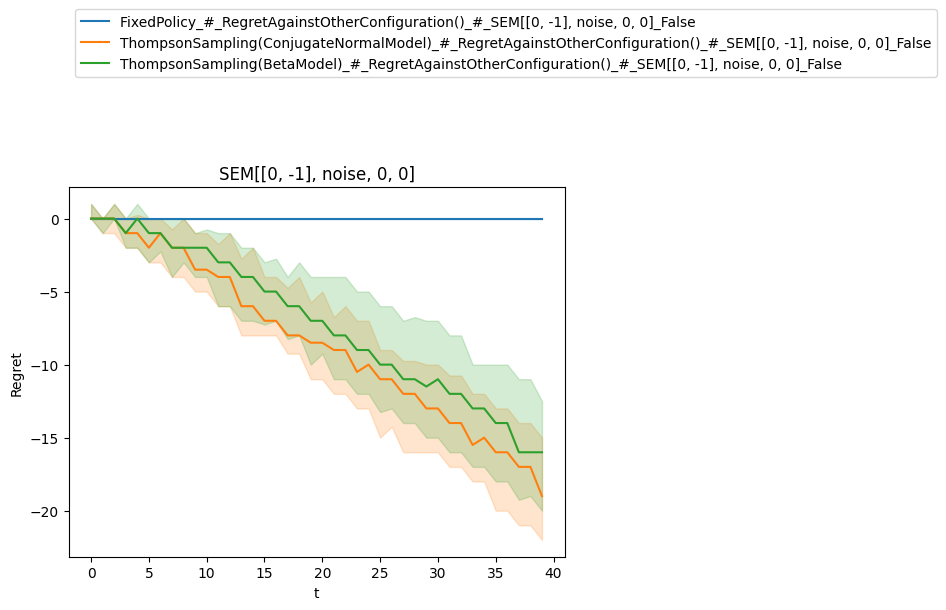

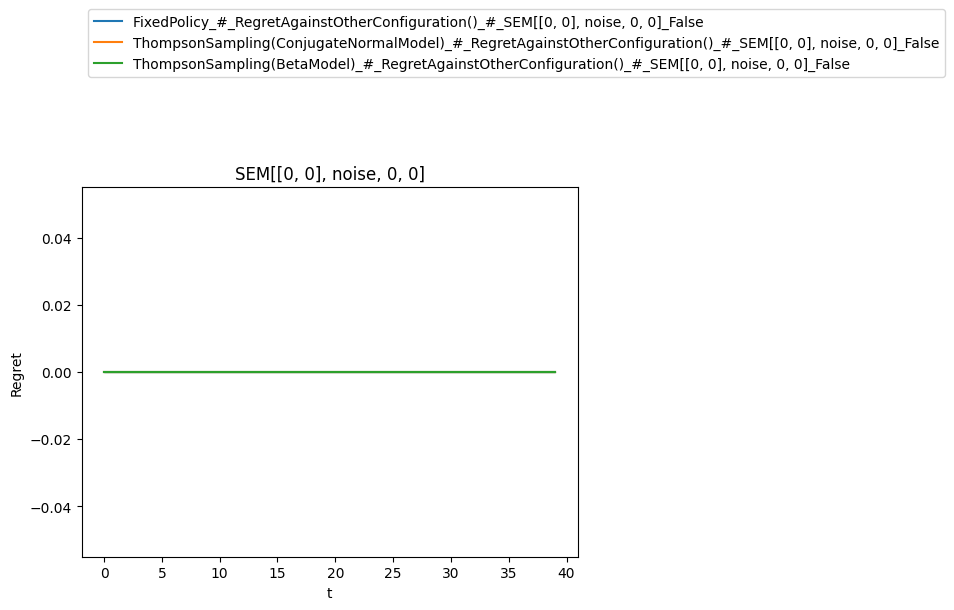

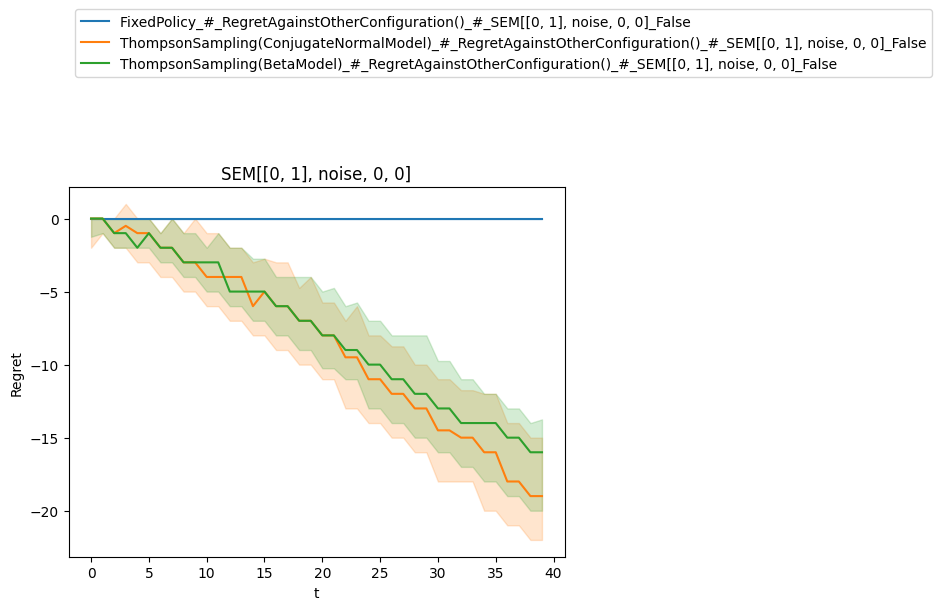

In [11]:
plot_regret_against_fixed(calculated_series, config_to_simulation_data)

In [12]:
def plot_allocations_for_calculated_series(calculated_series):
    panels = [series["result"].plot_allocations() for series in calculated_series]
    for panel, i in zip(panels, range(len(panels))):
        panel.opts(
            title=f"{calculated_series[i]['configuration']['policy']}, {calculated_series[i]['configuration']['model']}",
            fontsize={"title": "80%"},
        )
    return holoviews.Layout(panels).cols(1)


plot_allocations_for_calculated_series(calculated_series)

/opt/homebrew/Caskroom/miniconda/base/envs/mt/lib/python3.11/site-packages/holoviews/plotting/bokeh/plot.py:987: UserWarning: found multiple competing values for 'toolbar.active_drag' property; using the latest value
  layout_plot = gridplot(
/opt/homebrew/Caskroom/miniconda/base/envs/mt/lib/python3.11/site-packages/holoviews/plotting/bokeh/plot.py:987: UserWarning: found multiple competing values for 'toolbar.active_scroll' property; using the latest value
  layout_plot = gridplot(


:Layout
   .HeatMap.I    :HeatMap   [t,patient_id]   (treatment,debug_info,context,outcome,counterfactual_outcomes,treatment)
   .HeatMap.II   :HeatMap   [t,patient_id]   (treatment,debug_info,context,outcome,counterfactual_outcomes,treatment)
   .HeatMap.III  :HeatMap   [t,patient_id]   (treatment,debug_info,context,outcome,counterfactual_outcomes,treatment)
   .HeatMap.IV   :HeatMap   [t,patient_id]   (treatment,debug_info,context,outcome,counterfactual_outcomes,treatment)
   .HeatMap.V    :HeatMap   [t,patient_id]   (treatment,debug_info,context,outcome,counterfactual_outcomes,treatment)
   .HeatMap.VI   :HeatMap   [t,patient_id]   (treatment,debug_info,context,outcome,counterfactual_outcomes,treatment)
   .HeatMap.VII  :HeatMap   [t,patient_id]   (treatment,debug_info,context,outcome,counterfactual_outcomes,treatment)
   .HeatMap.VIII :HeatMap   [t,patient_id]   (treatment,debug_info,context,outcome,counterfactual_outcomes,treatment)
   .HeatMap.IX   :HeatMap   [t,patient_id]   (treatment,debug_info,context,outcome,counterfactual_outcomes,treatment)

## R-Analysis

In [22]:
dfs = [entry["result"].pooled_histories().to_df() for entry in calculated_series]
dfs[0]

,t,treatment,baseline,continuous_outcome,discretized_outcome,outcome,patient_id,previous_context,previous_outcome
0,0,0,0.125730,0.125730,2,2,0,NaN,NaN
1,1,1,1.304000,0.304000,3,3,0,{'t': 0},"{'baseline': 0.1257302210933933, 'continuous_o..."
2,2,0,-2.325031,-2.325031,0,0,0,"{'previous_context': {'t': 0}, 'previous_outco...","{'baseline': 1.3040000451301372, 'continuous_o..."
3,3,1,0.411631,-0.588369,1,1,0,{'previous_context': {'previous_context': {'t'...,"{'baseline': -2.3250307746388343, 'continuous_..."
4,4,0,0.903470,0.903470,4,4,0,{'previous_context': {'previous_context': {'pr...,"{'baseline': 0.4116305363741328, 'continuous_o..."
...,...,...,...,...,...,...,...,...,...
3995,35,1,0.850954,-0.149046,2,2,99,{'previous_context': {'previous_context': {'pr...,"{'baseline': -1.9498243038154193, 'continuous_..."
3996,36,0,-1.084099,-1.084099,0,0,99,{'previous_context': {'previous_context': {'pr...,"{'baseline': 0.8509535992723561, 'continuous_o..."
3997,37,1,0.274511,-0.725489,1,1,99,{'previous_context': {'previous_context': {'pr...,"{'baseline': -1.0840985956159908, 'continuous_..."
3998,38,0,0.315147,0.315147,3,3,99,{'previous_context': {'previous_context': {'pr...,"{'baseline': 0.27451118205949626, 'continuous_..."


In [23]:
df = pandas.concat(dfs)

In [27]:
df[0:40].to_csv("one_patient.csv")